<a href="https://colab.research.google.com/github/alexD1990/Tensorflow-image-classification/blob/main/Dog_Vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# End-to-end multi-class dog breed classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub

## 1. Problem
Identifying the breed of a dog given an image of a dog.

When im stitting at the cafe and i take a photo of a dog, i want to know what breed of dog it is.

## 2. Data

The data we are using is from Kaggles dog breed identification competition
https://www.kaggle.com/competitions/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image. https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:
* We are dealing with images (unstructured data) so its probably best we use deep learning/transfer learning.
* There are 120 breeds of dog (this mean there is 120 diffeferent classes).
* There are around 10 000+ images in the training set (These images have labels)
* There are around 10 000+ images in the test set (These images have no label, since we are going to predict the labels)

## Conect to file directory in google drive

In [1]:
%cd /content/drive/MyDrive/Machine learning course/Milestone Project 3 - Unsupervised Learning Deep Learning Neural Network/Data/dog-breed-identification


/content/drive/MyDrive/Machine learning course/Milestone Project 3 - Unsupervised Learning Deep Learning Neural Network/Data/dog-breed-identification


### Get our workspace ready

* Import TensorFlow 2.x
* Import TensorFlow hub
* Make sure we are using a GPU

In [2]:
# Import necessary tools

import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("Tensorfllow HUB:", hub.__version__)

# Check for GPU availability

print("GPU", "available (YESSSS!!!!!)" if tf.config.list_logical_devices("GPU") else "Not available :(")

TF version: 2.12.0
Tensorfllow HUB: 0.13.0
GPU available (YESSSS!!!!!)


## Getting our data ready (turning into tensors)

With all machine learning models, our data has to be in numerical format. So we are going to turn our data into tensors (numerical representation)

Lets start with accessing our data and checking out the label

In [3]:
# Check out the labels of our data

import pandas as pd
labels_csv = pd.read_csv("labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [4]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: >

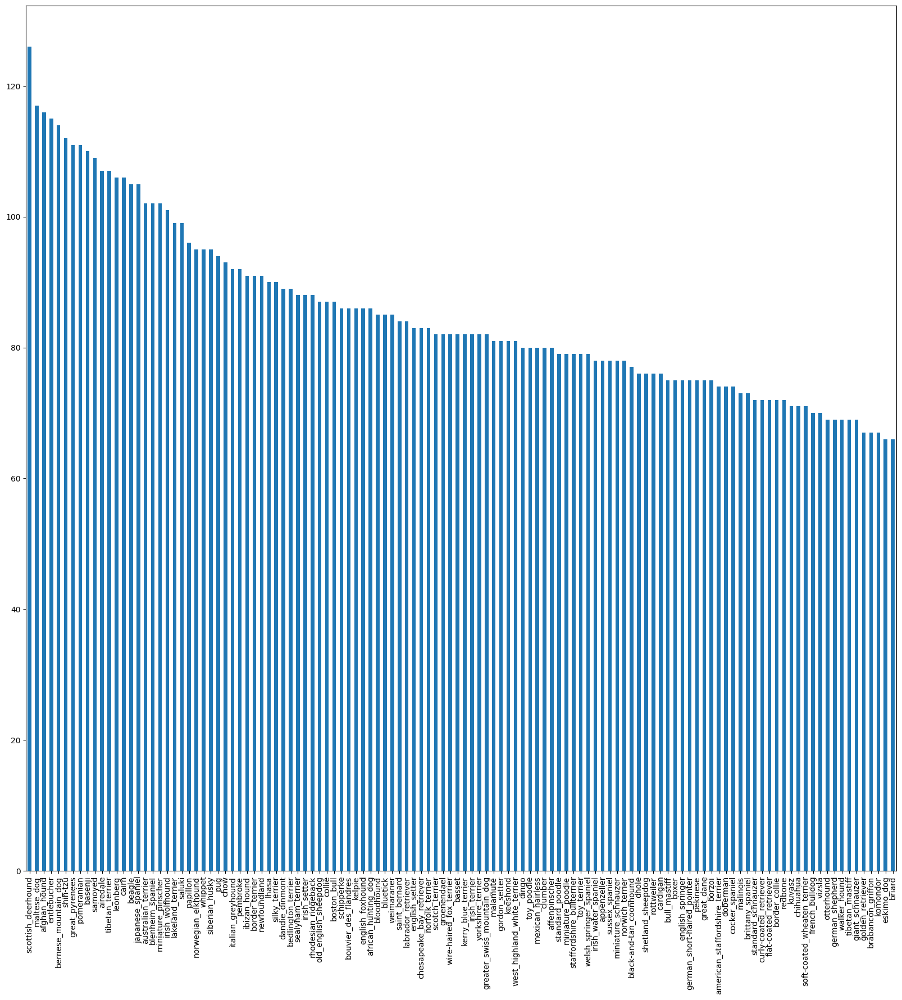

In [5]:
# How many images are there of each dog
labels_csv["breed"].value_counts().plot.bar(figsize=(20,20))

In [6]:
labels_csv["breed"].value_counts().median()

82.0

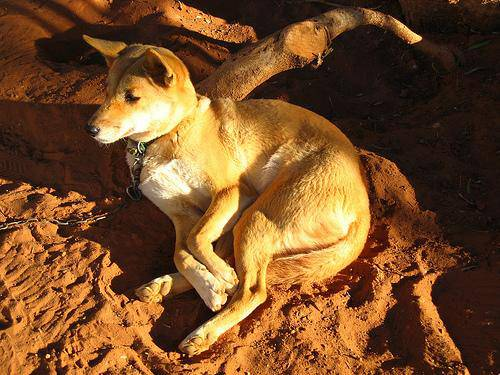

In [7]:
# Lets view a image

from IPython.display import Image
Image('/content/drive/MyDrive/Machine learning course/Milestone Project 3 - Unsupervised Learning Deep Learning Neural Network/Data/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg')

## Getting images and their labels

Lets get a list of all of our image pathnames

In [8]:
# Create pathnames from images ID
filenames = ['/content/drive/MyDrive/Machine learning course/Milestone Project 3 - Unsupervised Learning Deep Learning Neural Network/Data/dog-breed-identification/train/' + fname + '.jpg' for fname in labels_csv['id']]

# Chack the first 10
filenames[:10]

['/content/drive/MyDrive/Machine learning course/Milestone Project 3 - Unsupervised Learning Deep Learning Neural Network/Data/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Machine learning course/Milestone Project 3 - Unsupervised Learning Deep Learning Neural Network/Data/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Machine learning course/Milestone Project 3 - Unsupervised Learning Deep Learning Neural Network/Data/dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Machine learning course/Milestone Project 3 - Unsupervised Learning Deep Learning Neural Network/Data/dog-breed-identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Machine learning course/Milestone Project 3 - Unsupervised Learning Deep Learning Neural Network/Data/dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/driv

In [9]:
import os
os.listdir('/content/drive/MyDrive/Machine learning course/Milestone Project 3 - Unsupervised Learning Deep Learning Neural Network/Data/dog-breed-identification/train/')[:10]

['dd5a3c84fb3c388ecf0b4da61eaef352.jpg',
 'e13bcf54507eaba884de1faea9af4dd9.jpg',
 'de8c32b71a43eef41eb1af93c1baf150.jpg',
 'e1e156d500e30cf73f53970a09af93c9.jpg',
 'e3a6203b61fa9cd2ffad92ebe31334ca.jpg',
 'dd273d04d5bd6da804f278fc767c6ca8.jpg',
 'dd3509cbfcfc094e5e4726b648a26048.jpg',
 'e917bb5669e0c273eb16304af1f69e1d.jpg',
 'e13d468a13740374b13ad373d508c58c.jpg',
 'dee5db7f0834ca1db80615a9d5fb6334.jpg']

In [10]:
# Check wheter number or filenames matches number of actual image files
import os
if len(os.listdir('/content/drive/MyDrive/Machine learning course/Milestone Project 3 - Unsupervised Learning Deep Learning Neural Network/Data/dog-breed-identification/train')) == len(filenames):
  print("Filename match actual amount of files, proceed!!")
else:
  print("Filename do not match actual amount of files, check the target directory!")

Filename do not match actual amount of files, check the target directory!


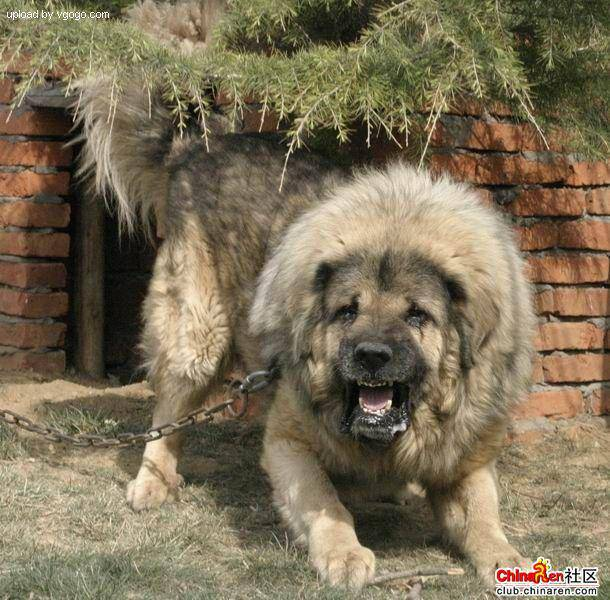

In [11]:
# One more check
Image(filenames[9000])

In [12]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we are now got our training filepaths in a list, lets prepare our labels.

In [13]:
import numpy as np
labels = labels_csv["breed"]
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [14]:
len(labels)

10222

In [15]:
# See if number of labels matches the nuber of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames")
else:
  print("Number of labels does not match the number of filenames, check data directory")

Number of labels matches number of filenames


In [16]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [17]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [18]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [19]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [20]:
len(boolean_labels)

10222

In [21]:
# Example: Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # Index where label occurs
print(boolean_labels[0].argmax()) # Index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occur

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [22]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [23]:
filenames[:10]

['/content/drive/MyDrive/Machine learning course/Milestone Project 3 - Unsupervised Learning Deep Learning Neural Network/Data/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Machine learning course/Milestone Project 3 - Unsupervised Learning Deep Learning Neural Network/Data/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Machine learning course/Milestone Project 3 - Unsupervised Learning Deep Learning Neural Network/Data/dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Machine learning course/Milestone Project 3 - Unsupervised Learning Deep Learning Neural Network/Data/dog-breed-identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Machine learning course/Milestone Project 3 - Unsupervised Learning Deep Learning Neural Network/Data/dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/driv

## Creating our own validation set

Since the dataset from Kaggle does not come with a validation set, we are going to create our own.

In [24]:
# setup x & y variables
x = filenames
y = boolean_labels

We are going to start off experimenting with 1000 images and increase as needed

In [25]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [26]:
# Lets split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
x_train, x_val, y_train, y_val = train_test_split(x[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(x_train), len(y_train), len(x_val), len(y_val)

(800, 800, 200, 200)

In [27]:
# Lets have a geez at the training data
x_train[:5], y_train[:2]

(['/content/drive/MyDrive/Machine learning course/Milestone Project 3 - Unsupervised Learning Deep Learning Neural Network/Data/dog-breed-identification/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/Machine learning course/Milestone Project 3 - Unsupervised Learning Deep Learning Neural Network/Data/dog-breed-identification/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/drive/MyDrive/Machine learning course/Milestone Project 3 - Unsupervised Learning Deep Learning Neural Network/Data/dog-breed-identification/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  '/content/drive/MyDrive/Machine learning course/Milestone Project 3 - Unsupervised Learning Deep Learning Neural Network/Data/dog-breed-identification/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  '/content/drive/MyDrive/Machine learning course/Milestone Project 3 - Unsupervised Learning Deep Learning Neural Network/Data/dog-breed-identification/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([

## Preprocessing images (turning images into Tensors)

### To preprocess our images into Tensors we are going to write a function which does a few things:

* 1. Take an image filepath as input
* 2. Use TensorFlow to read the file and save it to a variable, `Image`
* 3. Turn our `Image` (a jpg) into Tensors
* 4. Resize the `Image` to be a shape of (224,224)
* 5. Return the modified `Image`

Before we do, lets see what importing an image looks like.

In [28]:
# Convert image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [29]:
# Array
image[:2]

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)

In [30]:
# Turn image into a Tensor
tf.constant(image[:2])

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

Now we have seen what an image looks like as a Tensor, lets make a function to preprocess them.

* 1. Take an image filepath as input
* 2. Use TensorFlow to read the file and save it to a variable, `Image`
* 3. Turn our `Image` (a jpg) into Tensors
* 4. Normalize our image (convert color cannels values from 0-255 to 0-1
* 5. Resize the `Image` to be a shape of (224,224)
* 6. Return the modified `Image`

In [31]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Turning our data into batches

In [32]:
# Create a simple function to return a tuple (image, label)

def get_image_label(image_path, label):
  """
  Takes an image file path name and associated label,
  prodesses the image and return a tuple (image, label)
  """
  image = process_image(image_path)
  return image, label

In [33]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn our data into batches
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of images (x) and label (y) pairs.
  Shuffle the data if its training data but does not shuffle if its validation data.
  Also accepts test data as input (no label)
  """
  # If the dataset is a test dataset, we probably dont have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) #Only filepaths (no labels)
    data_batch = data.map(process_image).batch(batch_size)
    return data_batch

  # If the data is a valid dataset, we dont need to shuffle if
  elif valid_data:
    print("Creating valid data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), #Filepath
                                               tf.constant(y))) # Labels
    data_batch = data.map(get_image_label).batch(batch_size)
    return data_batch

  else:
    print("Creating training data batches")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                               tf.constant(y)))
    # Shuffeling pathnames and labels before mapping image processor is faster then shuffling images
    data = data.shuffle(buffer_size=len(x))

    #Create (Image and labels) tuples (This also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    #Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)

  return data_batch

In [34]:
# Create training and validation data batches
train_data = create_data_batches(x_train, y_train)
val_data = create_data_batches(x_val, y_val, valid_data=True)

Creating training data batches
Creating valid data batches...


In [35]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches, however these can be a little hard to understand/comprehend, lets visualize them

In [36]:
import matplotlib.pyplot as plt

#Create a function for viewing image in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch
  """
  #Setup the figure
  plt.figure(figsize=(15,15))
  #Loop trough 25
  for i in range(25):
    #Create subplots
    ax = plt.subplot(5, 5, i+1)
    #Display images
    plt.imshow(images[i])
    #Add the images label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    #Turn the grid lines of
    plt.axis("Off")

In [37]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

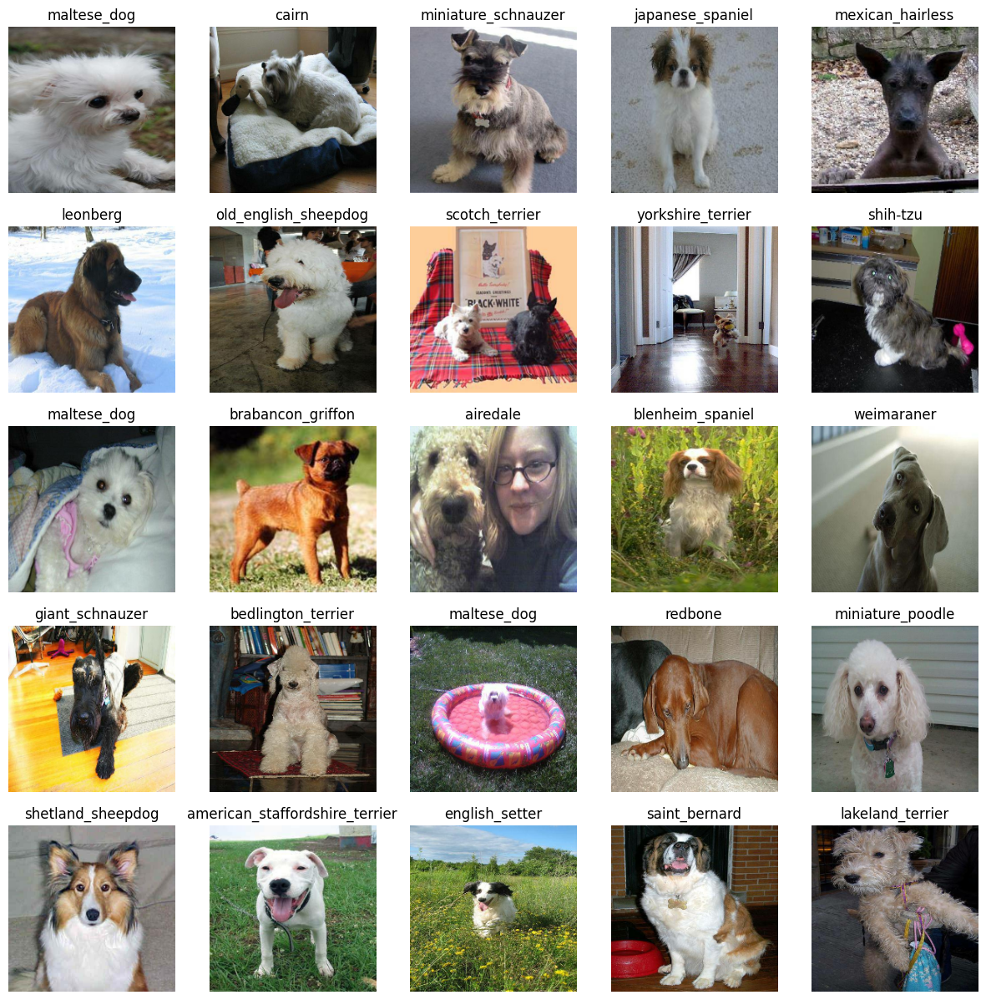

In [38]:
# Now lets visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

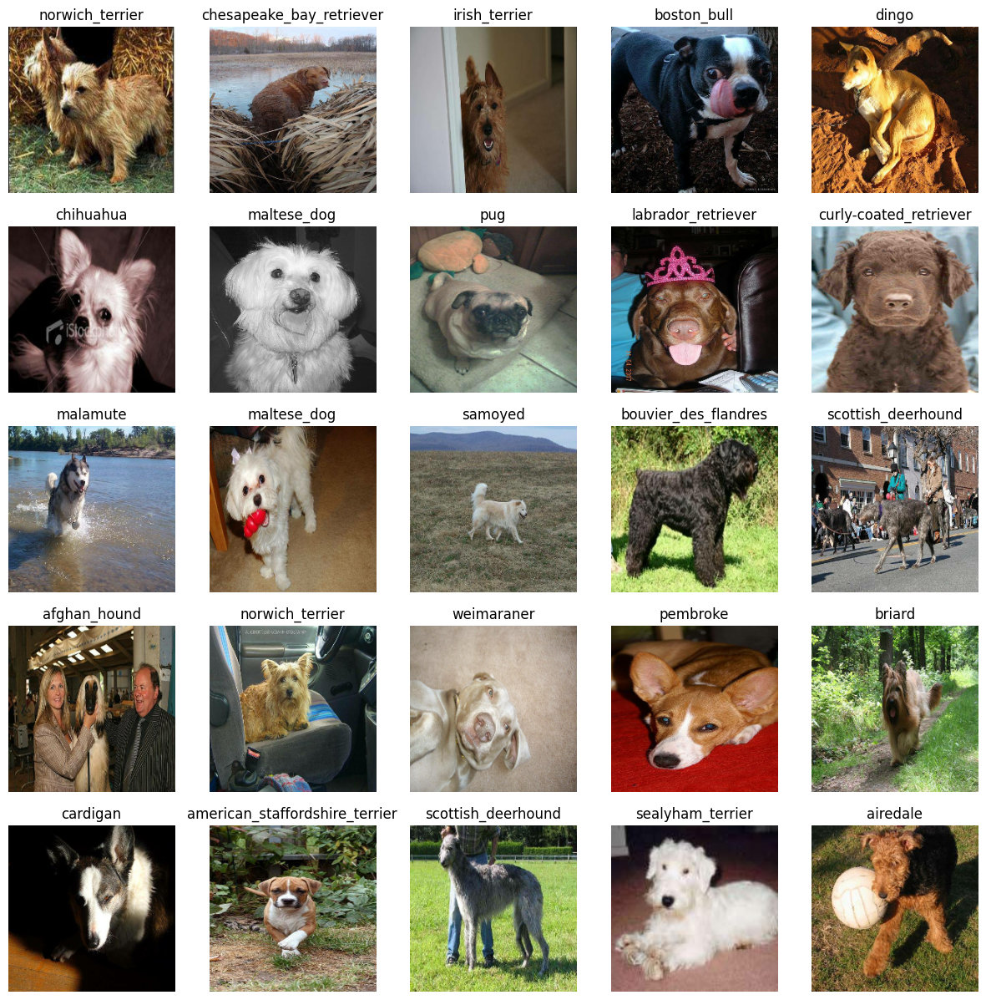

In [39]:
# Visualize training images from the training data batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

### Building a model

Before we build a model, there are a few things we need to define:
* The input shape (images, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use from TensorFlow Hub https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5

In [40]:
# Setuo input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] #Batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

Now we've got the inputs, outputs and model we're using ready to go. We can start to put them together

There are many ways of building a model in TensorFlow but one of the best ways to get started is to [use the Keras API](https://www.tensorflow.org/guide/keras/overview).

Defining a deep learning model in Keras can be as straightforward as saying, "here are the layers of the model, the input shape and the output shape, let's go!"

Knowing this, let's create a function which:
* Takes the input shape, output shape and the model we've chosen's URL as parameters.
* Defines the layers in a Keras model in a sequential fashion (do this first, then this, then that).
* Compiles the model (says how it should be evaluated and improved).
* Builds the model (tells it what kind of input shape it'll be getting).
* Returns the model.

We'll take a look at the code first, then dicuss each part.

In [41]:
# Create a function wich builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Bulding model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (out layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [42]:
model = create_model()
model.summary()

Bulding model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


### Creating callbacks

We've got a model ready to go but before we train it we'll make some callbacks.

Callbacks are helper functions a model can use during training to do things such as save a models progress, check a models progress or stop training early if a model stops improving.

The two callbacks we're going to add are a TensorBoard callback and an Early Stopping callback.

#### TensorBoard Callback

[TensorBoard](https://www.tensorflow.org/tensorboard/get_started) helps provide a visual way to monitor the progress of your model during and after training.

It can be used [directly in a notebook](https://www.tensorflow.org/tensorboard/tensorboard_in_notebooks) to track the performance measures of a model such as loss and accuracy.

To set up a TensorBoard callback and view TensorBoard in a notebook, we need to do three things:
1. Load the TensorBoard notebook extension.
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize the our models training logs using the `%tensorboard` magic function (we'll do this later on).

In [43]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [44]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("/content/drive/MyDrive/Machine learning course/Milestone Project 3 - Unsupervised Learning Deep Learning Neural Network/Logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)


#### Early Stopping Callback

[Early stopping](https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping) helps prevent overfitting by stopping a model when a certain evaluation metric stops improving. If a model trains for too long, it can do so well at finding patterns in a certain dataset that it's not able to use those patterns on another dataset it hasn't seen before (doesn't generalize).

It's basically like saying to our model, "keep finding patterns until the quality of those patterns starts to go down."

In [45]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

### Training a model (on a subset of data)
Our first model is only going to be trained on 1000 images. Or trained on 800 images and then validated on 200 images, meaning 1000 images total or about 10% of the total data.

In [46]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [47]:
# Check to make sure we are still running on a GPU
print("GPU", "available (YES)" if tf.config.list_physical_devices("GPU") else "Not available :(")

GPU available (YES)


Boom! We've got a GPU running and `NUM_EPOCHS` setup. Let's create a simple function which trains a model. The function will:
* Create a model using `create_model()`.
* Setup a TensorBoard callback using `create_tensorboard_callback()` (we do this here so it creates a log directory of the current date and time).
* Call the `fit()` function on our model passing it the training data, validatation data, number of epochs to train for and the callbacks we'd like to use.
* Return the fitted model.

In [48]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model

In [49]:
# Fit the model to the data
model = train_model()

Bulding model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 116s 3s/step - loss: 4.4938 - accuracy: 0.0913 - val_loss: 3.2770 - val_accuracy: 0.3000
Epoch 2/100
25/25 [==============================] - 4s 178ms/step - loss: 1.5759 - accuracy: 0.7050 - val_loss: 2.1024 - val_accuracy: 0.5500
Epoch 3/100
25/25 [==============================] - 4s 146ms/step - loss: 0.5435 - accuracy: 0.9400 - val_loss: 1.6702 - val_accuracy: 0.6250
Epoch 4/100
25/25 [==============================] - 3s 122ms/step - loss: 0.2406 - accuracy: 0.9875 - val_loss: 1.5035 - val_accuracy: 0.6450
Epoch 5/100
25/25 [==============================] - 3s 129ms/step - loss: 0.1411 - accuracy: 0.9987 - val_loss: 1.4461 - val_accuracy: 0.6650
Epoch 6/100
25/25 [==============================] - 5s 206ms/step - loss: 0.0978 - accuracy: 1.0000 - val_loss: 1.3918 - val_accuracy: 0.6550
Epoch 7/100
25/25 [==============================] 

**Question:** It looks like our model might be overfitting (getting far better results on the training set than the validation set), what are some ways to prevent model overfitting? Hint: this may involve searching something like "ways to prevent overfitting in a deep learning model?".

**Note:** Overfitting to begin with is a good thing. It means our model is learning something.

#### Checking the TensorBoard logs
Now our model has been trained, we can make its performance visual by checking the TensorBoard logs.

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and viualize its contents.

In [50]:
from tensorboard import notebook
notebook.list()

No known TensorBoard instances running.


In [51]:
!kill 20092

/bin/bash: line 0: kill: (20092) - No such process


In [52]:
%tensorboard --logdir "/content/drive/MyDrive/Machine learning course/Milestone Project 3 - Unsupervised Learning Deep Learning Neural Network/Logs"

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [53]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [54]:
# Make predictions on the valuation data (Not used to train with)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 100ms/step


array([[1.0706604e-03, 2.8459792e-04, 1.0346962e-03, ..., 1.6666614e-04,
        6.7039429e-05, 3.4458088e-03],
       [1.4116842e-03, 9.6103561e-04, 1.2815243e-02, ..., 4.5722100e-04,
        3.4397864e-03, 9.6776901e-04],
       [5.9713166e-06, 2.0589000e-04, 1.1030105e-03, ..., 6.4058804e-05,
        2.8419934e-05, 1.6453132e-04],
       ...,
       [3.3582106e-05, 4.1656083e-05, 1.2310175e-04, ..., 1.2189665e-05,
        5.2256906e-05, 1.2437325e-04],
       [1.7655878e-03, 2.4406333e-04, 4.6988789e-05, ..., 4.7035373e-05,
        1.5655151e-04, 3.2420815e-03],
       [3.6327222e-03, 1.0903430e-04, 1.1380115e-03, ..., 9.9133402e-03,
        3.2712773e-03, 1.6226979e-05]], dtype=float32)

In [55]:
np.sum(predictions[0])

1.0

In [56]:
# First prediction
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[1.1103082e-04 6.4180327e-05 1.4158514e-04 1.7028012e-04 1.6071431e-03
 3.9253722e-05 3.0470133e-04 2.2641830e-03 1.2773175e-02 4.1052293e-02
 2.7927321e-05 4.6030559e-06 2.4322687e-04 4.5774602e-03 2.6050066e-03
 4.9273954e-03 5.3136573e-05 5.4895511e-04 1.6444287e-04 5.9779047e-04
 1.0722577e-04 6.9517008e-04 3.9269631e-05 2.3184789e-04 7.4096122e-03
 3.4827687e-04 1.0487503e-04 1.5315664e-04 3.7165417e-04 3.1765390e-05
 3.1827338e-05 8.5432745e-05 1.5526968e-04 7.6647841e-05 1.4168915e-04
 8.7075568e-05 4.3973111e-04 2.8982759e-04 3.9514439e-04 2.7339837e-01
 3.4319953e-04 8.9430345e-05 3.6988554e-03 6.4300162e-05 3.2153408e-04
 6.8839494e-05 4.2898249e-04 8.0722815e-04 3.0220519e-05 5.7834043e-04
 1.1806450e-04 3.9607647e-04 2.2041603e-04 7.9078070e-04 1.8461225e-05
 5.7079876e-04 1.6673630e-04 1.3529566e-04 8.5093016e-05 4.9074686e-05
 1.4298836e-04 1.3297186e-03 3.3211993e-05 8.9553705e-06 2.1244133e-04
 1.1747933e-04 9.2074115e-05 2.2360477e-04 6.4827844e-05 3.9820803e-05
 3.480

In [57]:
unique_breeds[113]

'walker_hound'

Having this information is great but it would be even better if we could compare a prediction to its true label and original image.

To help us, let's first build a little function to convert prediction probabilities into predicted labels.

Note: Prediction probabilities are also known as confidence levels.

In [58]:
# Turn predictions probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[9])
pred_label

'collie'

Now since our validation data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels).

In [59]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [60]:
# Create a functio to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and return separate arrays of images and labels
  """
  images = []
  labels = []
  # Loop trough unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got ways to get get:

* Prediction labels
* Validation labels (truth labels)
* Validation images
Let's make some function to make these all a bit more visaulize.

We'll create a function which:

* Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer. ✅
* Convert the prediction probabilities to a predicted label. ✅
* Plot the predicted label, its predicted probability, the truth label and the * target image on a single plot. ✅

In [61]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot images and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is correct or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change the plot title to be predicted, probability of predictions and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color = color)

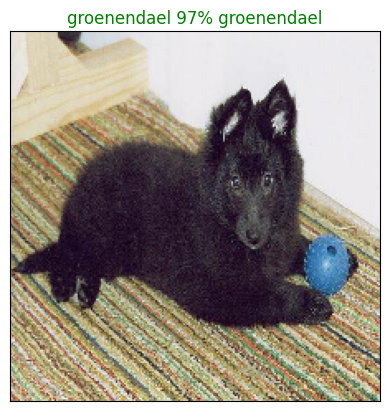

In [62]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

Now we've got one function to visualize our models top prediction, let's make another to view our models top 10 predictions.

This function will:

* Take an input of prediction probabilities array and a ground truth array and an integer ✅
* Find the prediction using get_pred_label() ✅
* Find the top 10:
* Prediction probabilities indexes ✅
* Prediction probabilities values ✅
* Prediction labels ✅
* Plot the top 10 prediction probability values and labels, coloring the true label green ✅

In [63]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidence along with the truth label for sample n.
  """

  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation = "vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

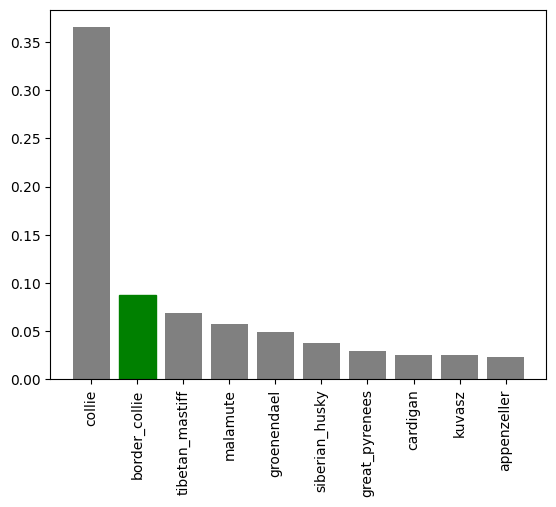

In [64]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

Now we've got some function to help us visualize our predictions and evaluate our modle, let's check out a few.

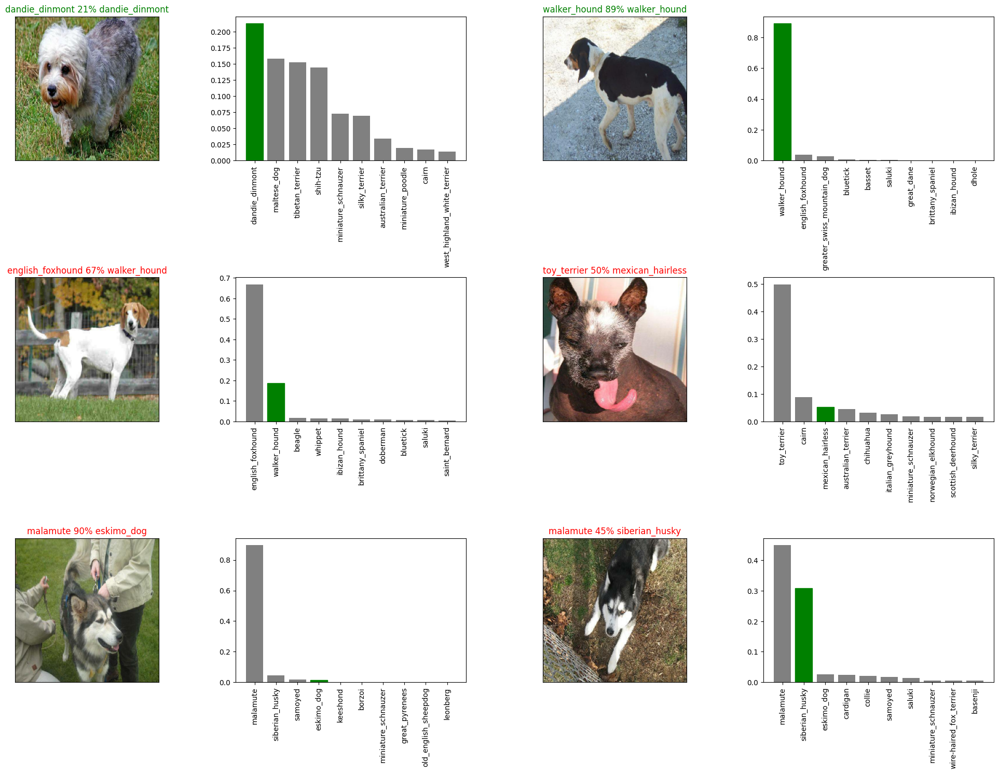

In [65]:
# Let's check out a few predictions and their different values
i_multiplier = 30
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving ad reload a trained model

In [66]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and append a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("/content/drive/MyDrive/Machine learning course/Milestone Project 3 - Unsupervised Learning Deep Learning Neural Network/Trained Models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # Save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [67]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Now we've got functions to save and load a trained model, let's make sure they work!

In [68]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Machine learning course/Milestone Project 3 - Unsupervised Learning Deep Learning Neural Network/Trained Models/20230707-11241688729041-1000-images-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/Machine learning course/Milestone Project 3 - Unsupervised Learning Deep Learning Neural Network/Trained Models/20230707-11241688729041-1000-images-mobilenetv2-Adam.h5'

In [69]:
# Load a trained model
loaded_1000_image_model = load_model("/content/drive/MyDrive/Machine learning course/Milestone Project 3 - Unsupervised Learning Deep Learning Neural Network/Trained Models/20230630-12161688127361-1000-images-mobilenetv2-Adam.h5")

Loading saved model from: /content/drive/MyDrive/Machine learning course/Milestone Project 3 - Unsupervised Learning Deep Learning Neural Network/Trained Models/20230630-12161688127361-1000-images-mobilenetv2-Adam.h5


In [70]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 86ms/step - loss: 1.3475 - accuracy: 0.6650


[1.3474634885787964, 0.6650000214576721]

In [71]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 100ms/step - loss: 1.2444 - accuracy: 0.6750


[1.2444096803665161, 0.675000011920929]

In [72]:
## Training a big dog model (On the full dataset)

## Training a big dog model (On the full dataset)

In [87]:
len(x), len(y)

(10222, 10222)

In [74]:
# Create a data batch with the full dataset
full_data = create_data_batches(x, y)

Creating training data batches


In [75]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [76]:
# Create a model for full model
full_model = create_model()

Bulding model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [77]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we cant monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [78]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 40s 112ms/step - loss: 1.3318 - accuracy: 0.6778
Epoch 2/100
320/320 [==============================] - 34s 105ms/step - loss: 0.3954 - accuracy: 0.8858
Epoch 3/100
320/320 [==============================] - 34s 108ms/step - loss: 0.2378 - accuracy: 0.9345
Epoch 4/100
320/320 [==============================] - 35s 108ms/step - loss: 0.1534 - accuracy: 0.9655
Epoch 5/100
320/320 [==============================] - 36s 111ms/step - loss: 0.1048 - accuracy: 0.9779
Epoch 6/100
320/320 [==============================] - 34s 105ms/step - loss: 0.0765 - accuracy: 0.9869
Epoch 7/100
320/320 [==============================] - 34s 105ms/step - loss: 0.0587 - accuracy: 0.9909
Epoch 8/100
320/320 [==============================] - 34s 105ms/step - loss: 0.0441 - accuracy: 0.9955
Epoch 9/100
320/320 [==============================] - 34s 106ms/step - loss: 0.0377 - accuracy: 0.9961
Epoch 10/100
320/320 [==============================] - 37s 115m

In [79]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Machine learning course/Milestone Project 3 - Unsupervised Learning Deep Learning Neural Network/Trained Models/20230707-11351688729743-full-image-set-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/Machine learning course/Milestone Project 3 - Unsupervised Learning Deep Learning Neural Network/Trained Models/20230707-11351688729743-full-image-set-mobilenetv2-Adam.h5'

In [80]:
# Load the full model
loaded_full_model = load_model('/content/drive/MyDrive/Machine learning course/Milestone Project 3 - Unsupervised Learning Deep Learning Neural Network/Trained Models/20230707-08171688717839-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/Machine learning course/Milestone Project 3 - Unsupervised Learning Deep Learning Neural Network/Trained Models/20230707-08171688717839-full-image-set-mobilenetv2-Adam.h5


## Making predictions on the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created create_data_batches() earlier which can take a list of filenames as input and conver them into Tensor batches.

To make predictions on the test data, we'll:

* Get the test image filenames. ✅
* Convert the filenames into test data batches using create_data_batches() and setting the test_data parameter to True (since the test data doesn't have labels). ✅
* Make a predictions array by passing the test batches to the predict() method called on our model.

In [99]:
# Load the test image filenames
test_path = "/content/drive/MyDrive/Machine learning course/Milestone Project 3 - Unsupervised Learning Deep Learning Neural Network/Data/dog-breed-identification/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/Machine learning course/Milestone Project 3 - Unsupervised Learning Deep Learning Neural Network/Data/dog-breed-identification/test/e14211c7b8cba3e46d5802291b765be7.jpg',
 '/content/drive/MyDrive/Machine learning course/Milestone Project 3 - Unsupervised Learning Deep Learning Neural Network/Data/dog-breed-identification/test/e246de79e4efd1145698d9c21466bbaf.jpg',
 '/content/drive/MyDrive/Machine learning course/Milestone Project 3 - Unsupervised Learning Deep Learning Neural Network/Data/dog-breed-identification/test/df2d806debebfd39e858f877756518e8.jpg',
 '/content/drive/MyDrive/Machine learning course/Milestone Project 3 - Unsupervised Learning Deep Learning Neural Network/Data/dog-breed-identification/test/e647098485898391b700270c61824282.jpg',
 '/content/drive/MyDrive/Machine learning course/Milestone Project 3 - Unsupervised Learning Deep Learning Neural Network/Data/dog-breed-identification/test/deb66780609abfef7f5048df02149839.jpg',
 '/content/drive/MyD

In [100]:
len(test_filenames)

10357

In [101]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [102]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [103]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 151s 456ms/step


In [106]:
# Save predictions (Numpy array) to csv file (for access later)
np.savetxt("/content/drive/MyDrive/Machine learning course/Milestone Project 3 - Unsupervised Learning Deep Learning Neural Network/test_predictions.csv", test_predictions, delimiter=",")


In [109]:
# Load predictions (Numpy array) from a csv file
test_predictions = np.loadtxt("/content/drive/MyDrive/Machine learning course/Milestone Project 3 - Unsupervised Learning Deep Learning Neural Network/test_predictions.csv", delimiter=",")



In [110]:
test_predictions[:10]

array([[1.24312105e-09, 1.95237582e-09, 4.11397458e-08, ...,
        7.08705699e-08, 4.69757424e-07, 6.33514901e-06],
       [1.82170538e-07, 7.41455078e-05, 8.54050697e-08, ...,
        7.00066403e-06, 4.95589802e-06, 1.85841043e-06],
       [7.27356246e-06, 3.93508337e-08, 4.33303143e-10, ...,
        6.33181060e-07, 2.75269758e-05, 2.00968003e-07],
       ...,
       [3.04239620e-06, 8.97444785e-09, 4.61906824e-09, ...,
        3.61343760e-10, 4.93171274e-06, 6.09142580e-06],
       [6.14915109e-07, 1.57724344e-06, 2.00691019e-09, ...,
        9.20215228e-08, 5.96135396e-05, 1.06057371e-06],
       [1.90444950e-07, 2.46859493e-08, 3.91816783e-08, ...,
        2.97485814e-10, 9.45728189e-08, 5.34097495e-08]])

##Preparing test dataset predictions for Kaggle
Looking at the Kaggle sample submission, we find that it wants our models prediction probaiblity outputs in a DataFrame with an ID and a column for each different dog breed. https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

To get the data in this format, we'll:

* Create a pandas DataFrame with an ID column as well as a column for each dog breed. ✅
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilites) to each of the dog breed columns.
Export the DataFrame as a CSV to submit it to Kaggle.

In [111]:
# Create a Pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [112]:
# Append test image ID's to predictions dataframe
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [113]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e14211c7b8cba3e46d5802291b765be7,1.243121e-09,1.952376e-09,4.113975e-08,4.126138e-07,1.528169e-06,1.119722e-04,6.402812e-06,4.516297e-04,2.144245e-07,...,3.384979e-05,4.182874e-01,5.368588e-10,1.054595e-08,7.929872e-08,6.557219e-08,2.933697e-06,7.087057e-08,4.697574e-07,6.335149e-06
1,e246de79e4efd1145698d9c21466bbaf,1.821705e-07,7.414551e-05,8.540507e-08,1.665770e-08,1.968622e-06,1.995691e-06,2.317701e-07,2.048583e-07,2.290671e-07,...,6.036566e-06,1.284738e-07,1.053079e-06,6.102653e-06,4.534360e-07,9.850631e-03,1.209526e-05,7.000664e-06,4.955898e-06,1.858410e-06
2,df2d806debebfd39e858f877756518e8,7.273562e-06,3.935083e-08,4.333031e-10,3.508869e-06,1.059681e-08,1.915540e-08,1.072563e-03,7.263141e-07,2.261618e-07,...,5.941736e-08,1.720882e-08,5.606103e-08,3.822921e-08,3.636793e-10,7.447292e-08,1.384929e-07,6.331811e-07,2.752698e-05,2.009680e-07
3,e647098485898391b700270c61824282,2.155465e-07,4.350106e-12,5.554702e-07,2.573396e-10,1.222639e-05,2.105937e-10,2.172760e-11,1.734467e-08,4.242744e-08,...,1.395744e-09,1.127938e-05,1.342845e-09,4.773750e-08,5.969222e-07,3.945191e-10,5.488257e-08,7.225023e-06,3.645942e-07,1.456534e-08
4,deb66780609abfef7f5048df02149839,6.481557e-08,2.146414e-05,5.108279e-08,1.776731e-08,6.170049e-07,7.038394e-10,3.723486e-08,1.716112e-08,3.000138e-09,...,4.335752e-05,9.973403e-07,1.337478e-06,1.966874e-06,4.530567e-05,5.222412e-04,2.006667e-05,8.990255e-04,2.687727e-05,1.884702e-07


In [114]:
# Save our predictions dataframe to csv for submission o Kaggle
preds_df.to_csv("/content/drive/MyDrive/Machine learning course/Milestone Project 3 - Unsupervised Learning Deep Learning Neural Network/full_model_predictions_submission_1_mobilenetv2.csv",
                index=False)

##Making predictions on custom images
To make predictions on custom images, we'll:

* Get the filepaths of our own images.
* Turn the filepaths into data batches using `create_data_batches()`. And since our custom images won't have labels, we set the `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom images.

In [121]:
# Get custom images path
custom_path = "/content/drive/MyDrive/Machine learning course/Milestone Project 3 - Unsupervised Learning Deep Learning Neural Network/custom-images/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [122]:
custom_image_paths

['/content/drive/MyDrive/Machine learning course/Milestone Project 3 - Unsupervised Learning Deep Learning Neural Network/custom-images/PXL_20230502_184813873.jpg',
 '/content/drive/MyDrive/Machine learning course/Milestone Project 3 - Unsupervised Learning Deep Learning Neural Network/custom-images/PXL_20230421_082501584.jpg',
 '/content/drive/MyDrive/Machine learning course/Milestone Project 3 - Unsupervised Learning Deep Learning Neural Network/custom-images/IMG_20210613_214945.jpg',
 '/content/drive/MyDrive/Machine learning course/Milestone Project 3 - Unsupervised Learning Deep Learning Neural Network/custom-images/IMG_20210718_215614.jpg']

In [123]:
# Turn custom images into batch dataset
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [124]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 1s/step


In [127]:
custom_preds.shape

(4, 120)

In [128]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['greater_swiss_mountain_dog',
 'bernese_mountain_dog',
 'cardigan',
 'bernese_mountain_dog']

In [129]:
# Get custom images (our batchify() wont work since there is no labels)
custom_images = []
# Loop trough unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

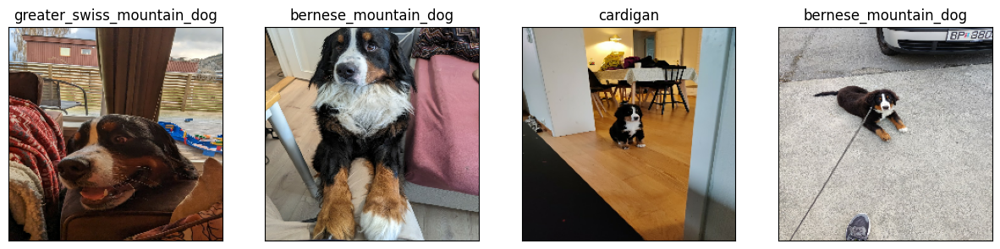

In [132]:
# Check custom image predictions
plt.figure(figsize=(15, 15))
for i, image in enumerate(custom_images):
  plt.subplot(1, 4, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)